# Intro

https://mostly.ai/docs/datasets#cdnow-dataset

docker compose up

In [6]:
from dotenv import load_dotenv
import os
from mostlyai.sdk import MostlyAI

load_dotenv()
api_key = os.getenv("MOSTLYAI_API_KEY")
# mostly = MostlyAI(local=False, api_key=api_key)
mostly = MostlyAI(local=True)


Initializing Synthetic Data SDK 4.5.2 in LOCAL mode 🏠

Connected to ]8;id=571863;file:///Users/kenneth.hamilton/mostlyai\/Users/kenneth.hamilton/]8;;\]8;id=211003;file:///Users/kenneth.hamilton/mostlyai\mostlyai]8;;\ with 16 GB RAM, 10 CPUs, 0 GPUs available

Database connection failed with error: (mysql.connector.errors.DatabaseError) 2003 (HY000): Can't connect to MySQL server on 'localhost:3306' (61)
(Background on this error at: https://sqlalche.me/e/20/4xp6)


In [8]:
# MOSTLY LOCAL

src_c = mostly.connect(config={
    "name": "Local MariaDB Source",
    "type": "MARIADB",
    "access_type": "READ_DATA",
    "config": {
        "host": "localhost",
        "port": 3306,  
        "username": "user",
        "database": "testdb"
    },
    "secrets": {
        "password": "password"
    }
})

dest_c = mostly.connect(config={
    "name": "Local MariaDB Destination",
    "type": "MARIADB",
    "access_type": "WRITE_DATA",
    "config": {
        "host": "localhost",
        "port": 3306,  
        "username": "user",
        "database": "testdb"
    },
    "secrets": {
        "password": "password"
    }
})

Created connector 11500921-cfb8-4d07-abb7-0016b10b1823

Created connector 5e76a44d-2552-4163-9e07-fc8da42af297

In [ ]:
# MOSTLY REMOTE

src_c = mostly.connect(config={
    "name": "Local MariaDB Source",
    "type": "MARIADB",
    "access_type": "READ_DATA",
    "config": {
        "host": "6.tcp.eu.ngrok.io",
        "port": 11811,  
        "username": "user",
        "database": "testdb"
    },
    "secrets": {
        "password": "password"
    }
})

dest_c = mostly.connect(config={
    "name": "Local MariaDB Destination",
    "type": "MARIADB",
    "access_type": "WRITE_DATA",
    "config": {
        "host": "6.tcp.eu.ngrok.io",
        "port": 11811,  
        "username": "user",
        "database": "testdb"
    },
    "secrets": {
        "password": "password"
    }
})

Created connector ]8;id=107839;https://app.mostly.ai/d/connectors/f76f621a-4dbe-40ad-b2a8-a56fca12d908\f76f621a-4dbe-40ad-b2a8-a56fca12d908]8;;\

Created connector ]8;id=69672;https://app.mostly.ai/d/connectors/92963dce-82fb-4bd7-be08-2cfe3900b45d\92963dce-82fb-4bd7-be08-2cfe3900b45d]8;;\

Created generator e2f3ddb6-85be-44e0-9203-86d9eed89438

Started generator training

Output()

🎉 Your generator is ready! Use it to create synthetic data. Publish it so others can do the same.


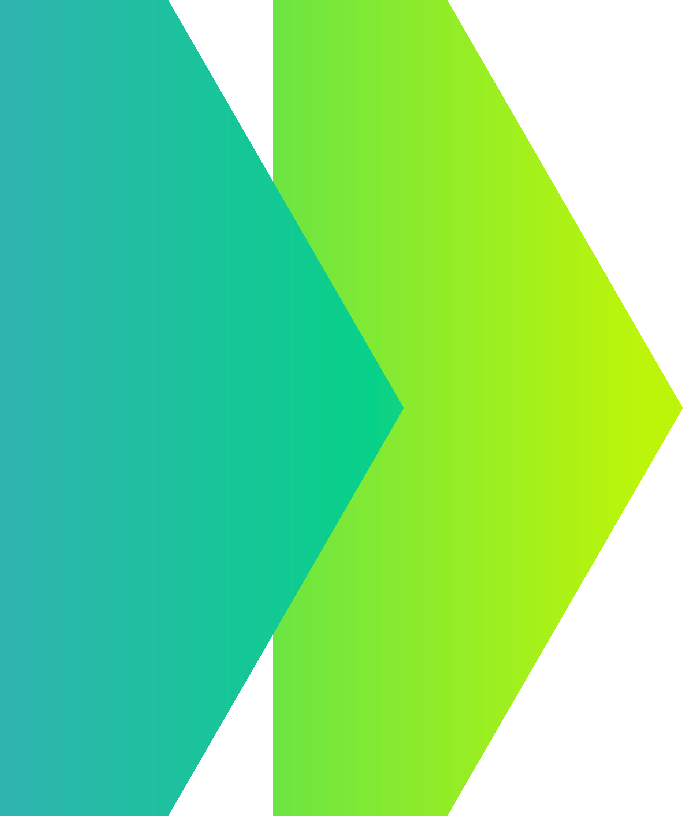
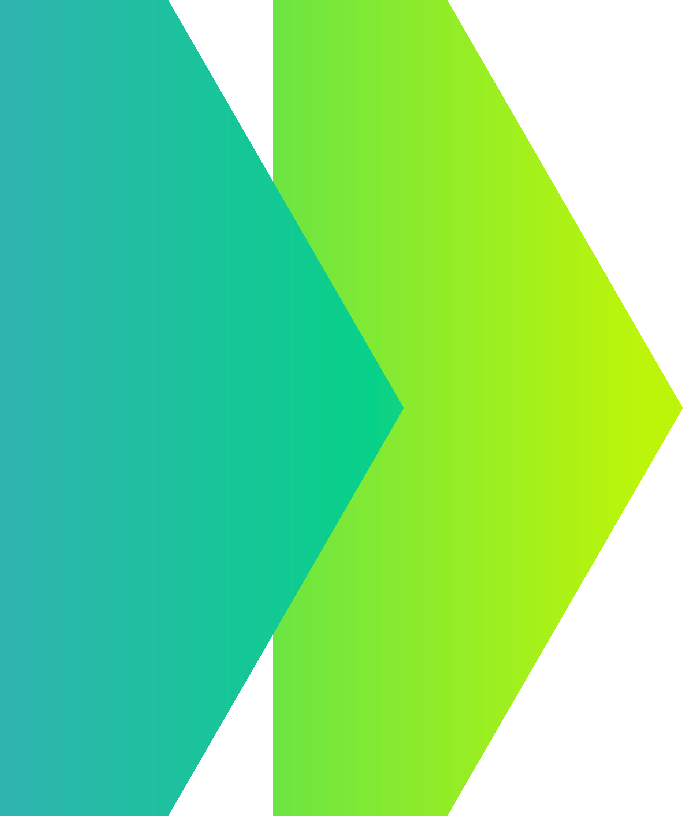
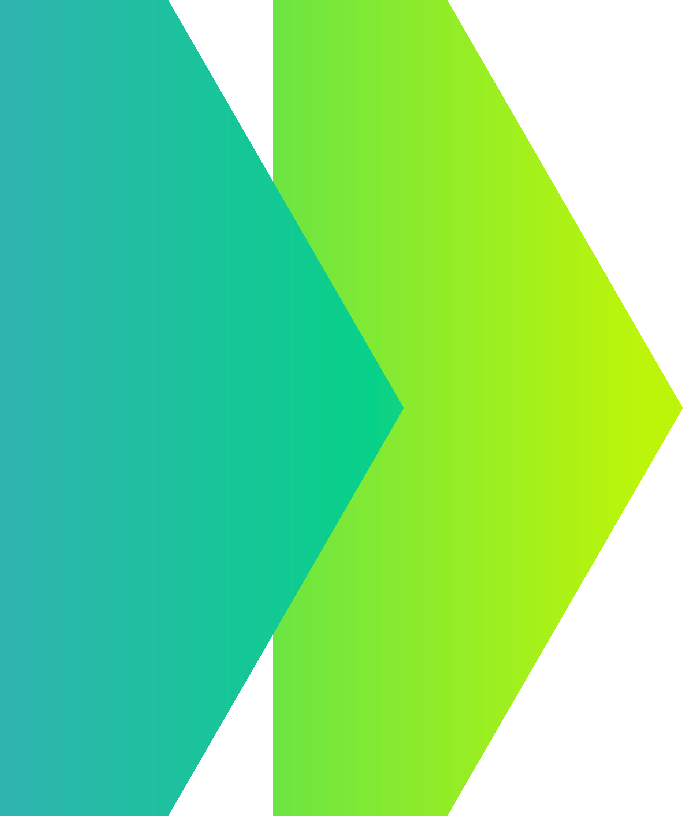
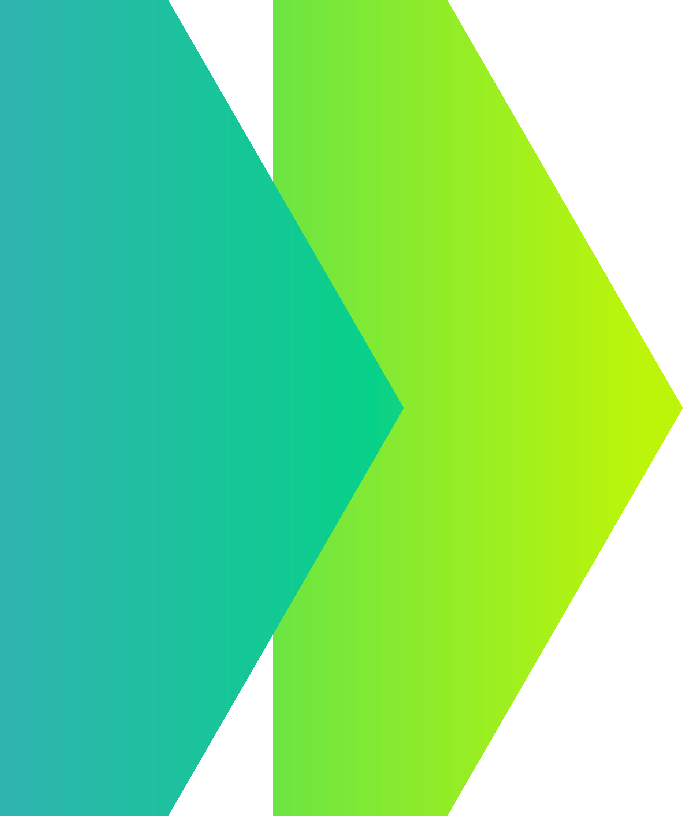
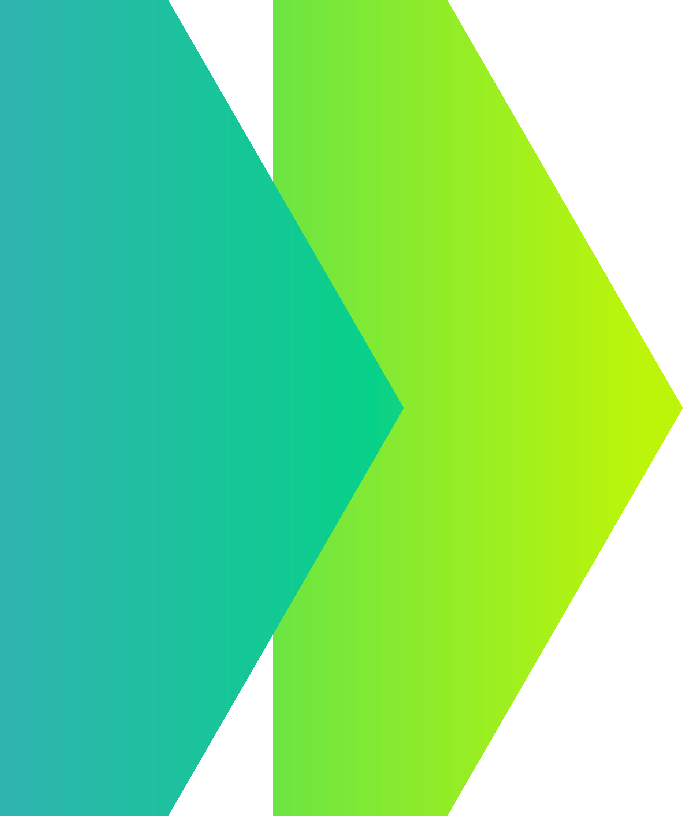
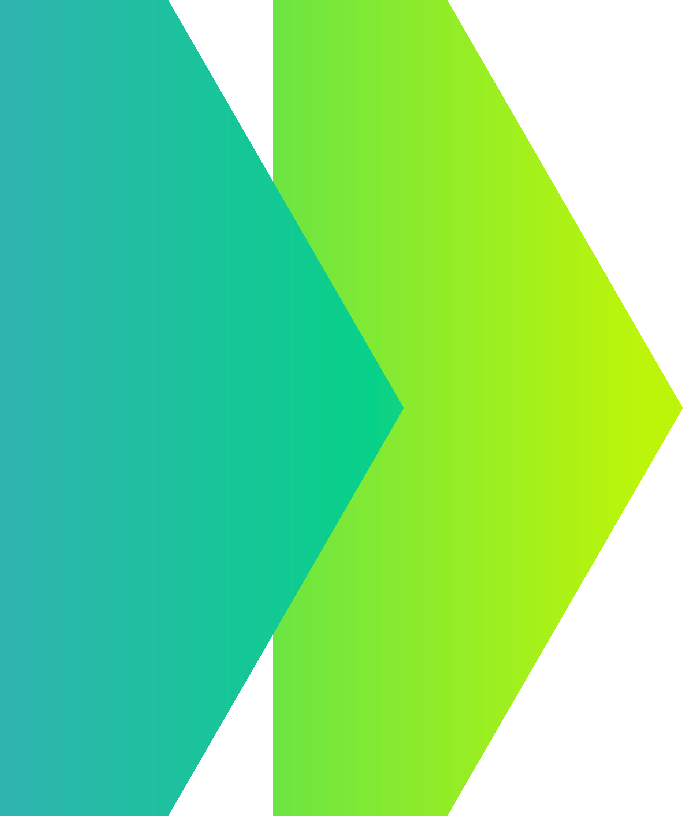

In [ ]:
# ✅ Step 3: Train a synthetic generator
g = mostly.train(config={
    'name': 'CDNOW_synthetic_gen',
    'tables': [
        {
            'name': 'Customers',
            'source_connector_id': src_c.id,
            'location': 'testdb.Customers',
        },
        {
            'name': 'Purchases',
            'source_connector_id': src_c.id,
            'location': 'testdb.Purchases',
        },
    ],
}, start=True, wait=True)

# show Model QA reports
g.reports(display=True)

In [10]:
sd = mostly.generate(g, config={
    "name": "CDNOW_synthetic_dataset",
    "delivery": {
        "destination_connector_id": dest_c.id,
        "location": "synth_testdb",
        "overwrite_tables": True
    }
})

Created synthetic dataset 2685fa5d-ab8d-48a3-8440-8a8d3cccc592 with generator e2f3ddb6-85be-44e0-9203-86d9eed89438

Started synthetic dataset generation

Output()

🎉 Your synthetic dataset is ready! Use it to consume the generated data. Publish it so others can do the same.

In [11]:
read_c = mostly.connect(config={
    "name": "Local MariaDB Source",
    "type": "MARIADB",
    "access_type": "READ_DATA",
    "config": {
        "host": "localhost", 
        "port": 3306,
        "username": "user",
        "database": "testdb"
    },
    "secrets": {
        "password": "password"
    }
})

Created connector 59960b3b-0cc8-42eb-bb76-946798a9c309

In [15]:
# === Step 1: Connect to Source and Synthetic Connectors ===
connector = mostly.connectors.get(read_c.id)

In [16]:
# Customers Table
real_customers = connector.query("SELECT * FROM testdb.Customers")
synth_customers = connector.query("SELECT * FROM synth_testdb.Customers")

# Purchases Table
real_purchases = connector.query("SELECT * FROM testdb.Purchases")
synth_purchases = connector.query("SELECT * FROM synth_testdb.Purchases")

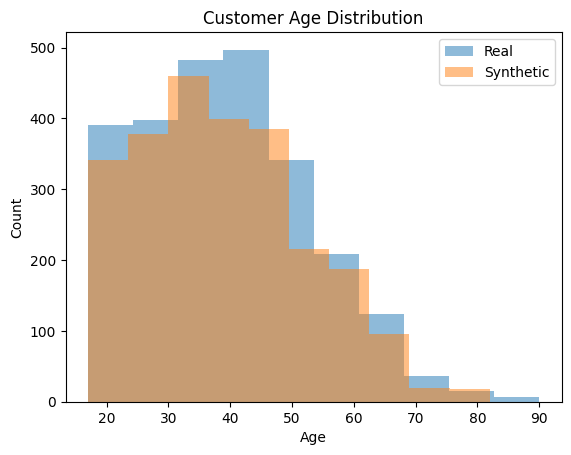

In [25]:
from matplotlib import pyplot as plt

# === Step 3: Chart Comparisons ===

# --- Customers: Age Distribution ---
plt.figure()
real_customers['age'].plot(kind='hist', bins=10, alpha=0.5, label='Real')
synth_customers['age'].plot(kind='hist', bins=10, alpha=0.5, label='Synthetic')
plt.title('Customer Age Distribution')
plt.xlabel('Age')
plt.ylabel('Count')
plt.legend()
plt.show()

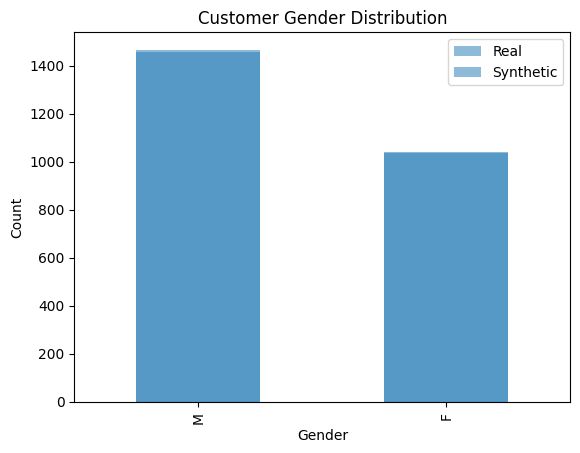

In [18]:
# --- Customers: Gender Count ---
plt.figure()
real_customers['gender'].value_counts().plot(kind='bar', alpha=0.5, label='Real')
synth_customers['gender'].value_counts().plot(kind='bar', alpha=0.5, label='Synthetic')
plt.title('Customer Gender Distribution')
plt.xlabel('Gender')
plt.ylabel('Count')
plt.legend()
plt.show()

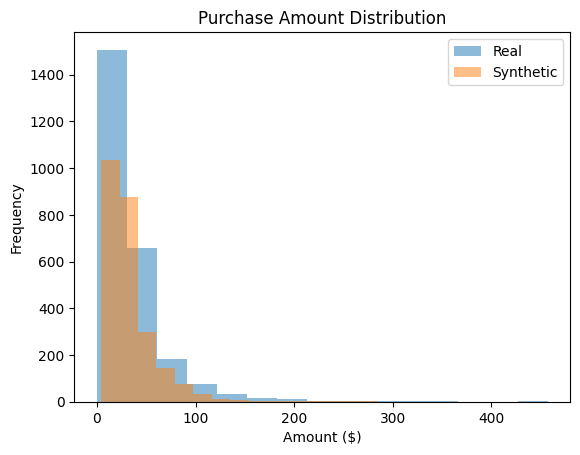

In [19]:
# --- Purchases: Amount Distribution ---
plt.figure()
real_purchases['amt'].plot(kind='hist', bins=15, alpha=0.5, label='Real')
synth_purchases['amt'].plot(kind='hist', bins=15, alpha=0.5, label='Synthetic')
plt.title('Purchase Amount Distribution')
plt.xlabel('Amount ($)')
plt.ylabel('Frequency')
plt.legend()
plt.show()

In [20]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Use your existing connector objects
real_join_query = """
SELECT
    c.zone,
    c.age,
    c.gender,
    COUNT(p.id) AS num_purchases,
    AVG(p.amt) AS avg_amt
FROM testdb.Customers c
JOIN testdb.Purchases p ON c.id = p.users_id
GROUP BY c.id, c.zone, c.age, c.gender
"""

synth_join_query = """
SELECT
    c.zone,
    c.age,
    c.gender,
    COUNT(p.id) AS num_purchases,
    AVG(p.amt) AS avg_amt
FROM synth_testdb.Customers c
JOIN synth_testdb.Purchases p ON c.id = p.users_id
GROUP BY c.id, c.zone, c.age, c.gender
"""

real_df = connector.query(real_join_query)
synth_df = connector.query(synth_join_query)

real_df['source'] = 'Real'
synth_df['source'] = 'Synthetic'
combined = pd.concat([real_df, synth_df], ignore_index=True)


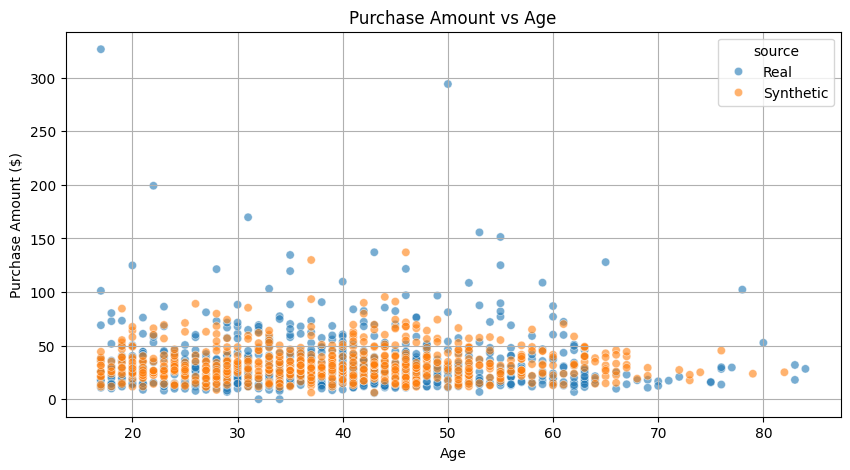

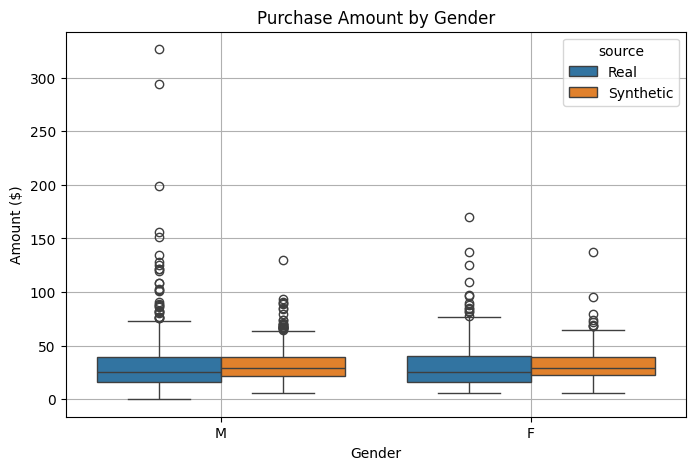

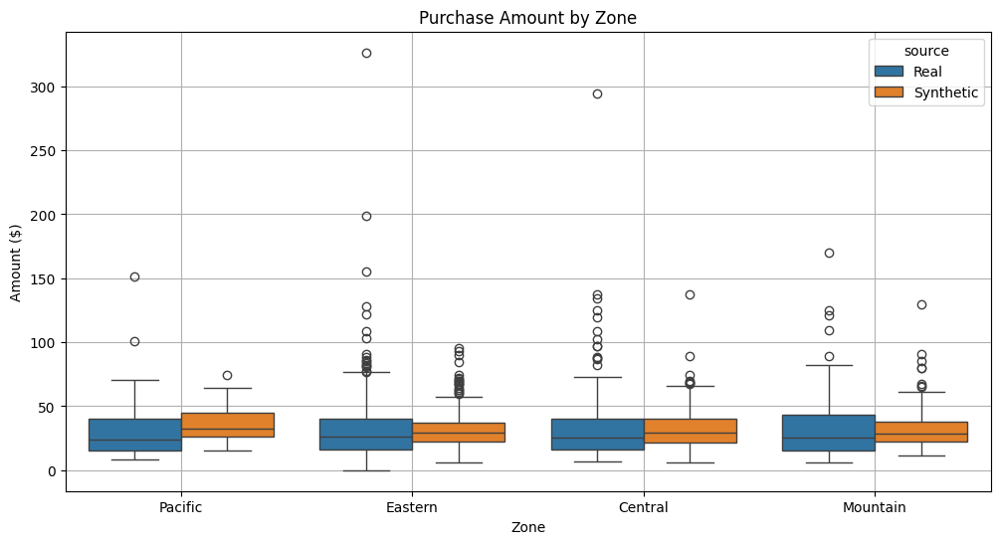

In [22]:
# --- Scatter plot: Age vs Purchase Amount ---
plt.figure(figsize=(10, 5))
sns.scatterplot(data=combined, x='age', y='avg_amt', hue='source', alpha=0.6)
plt.title('Purchase Amount vs Age')
plt.xlabel('Age')
plt.ylabel('Purchase Amount ($)')
plt.grid(True)
plt.show()

# --- Boxplot: Purchase Amount by Gender ---
plt.figure(figsize=(8, 5))
sns.boxplot(data=combined, x='gender', y='avg_amt', hue='source')
plt.title('Purchase Amount by Gender')
plt.xlabel('Gender')
plt.ylabel('Amount ($)')
plt.grid(True)
plt.show()

# --- Boxplot: Purchase Amount by Zone ---
plt.figure(figsize=(12, 6))
sns.boxplot(data=combined, x='zone', y='avg_amt', hue='source')
plt.title('Purchase Amount by Zone')
plt.xlabel('Zone')
plt.ylabel('Amount ($)')
plt.grid(True)
plt.show()

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Convert age into decile bins
combined['age_decile'] = pd.qcut(combined['age'], 10, duplicates='drop')  # handles ties

# --- Scatter plot: Age (binned) vs Avg Purchase Amount ---
# We'll use a bar plot instead since it's averaged per bin
plt.figure(figsize=(12, 5))
sns.barplot(data=combined, x='age_decile', y='avg_amt', hue='source', ci=None)
plt.title('Average Purchase Amount by Age Decile')
plt.xlabel('Age Group (Decile)')
plt.ylabel('Avg Purchase Amount ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

# --- Boxplot: Avg Purchase Amount by Gender ---
plt.figure(figsize=(8, 5))
sns.boxplot(data=combined, x='gender', y='avg_amt', hue='source')
plt.title('Purchase Amount by Gender')
plt.xlabel('Gender')
plt.ylabel('Avg Amount ($)')
plt.grid(True)
plt.show()

# --- Boxplot: Avg Purchase Amount by Zone ---
plt.figure(figsize=(12, 6))
sns.boxplot(data=combined, x='zone', y='avg_amt', hue='source')
plt.title('Purchase Amount by Zone')
plt.xlabel('Zone')
plt.ylabel('Avg Amount ($)')
plt.grid(True)
plt.show()


/var/folders/0s/298dbp0n3472rp9j_k27yp040000gn/T/ipykernel_71619/3674021266.py:11: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=combined, x='age_category', y='avg_amt', hue='source', ci=None)


ValueError: Could not interpret value `age_category` for `x`. An entry with this name does not appear in `data`.

<Figure size 1200x500 with 0 Axes>